# EC7212 – Computer Vision and Image Processing
## Take Home Assignment 1


In [2]:
pip install opencv-python

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.5 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.5 MB ? eta -:--:--
    --------------------------------------- 0.8/39.5 MB 1.2 MB/s eta 0:00:32
   - -------------------------------------- 1.0/39.5 MB 1.6 MB/s eta 0:00:24
   - -------------------------------------- 1.3/39.5 MB 1.6 MB/s eta 0:00:24
   -- ------------------------------------- 2.1/39.5 MB 1.8 MB/s eta 0:00:22
   -- ------------------------------------- 2.4/39.5 MB 1.7 MB/s eta 0:00:22
   -- ------------------------------------- 2.4/39.5 MB 1.7 MB/s eta 0:00:22
   -- ------------------------------------- 2.4/39.5 MB 1.7 MB/s eta 0:00:22
   -- ------------------------------------- 2.9/39.5 MB 1.4 MB/s eta 0:00:26
   --- -------------------

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import os

%matplotlib inline
plt.rcParams['figure.figsize'] = (15, 10)  

Found image at InputImages/Dog.jpg


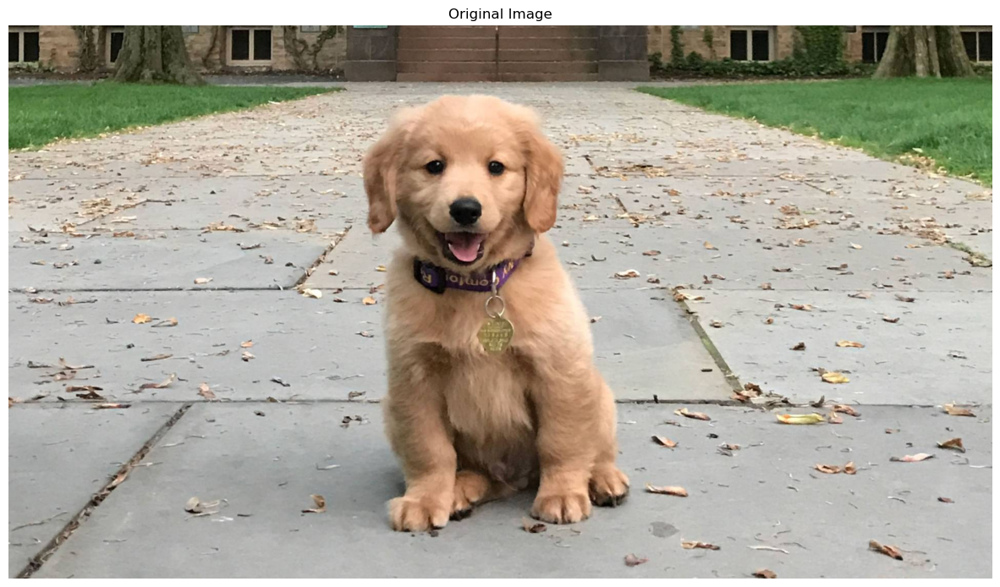

In [14]:
input_image_path = "InputImages/Dog.jpg"

if os.path.exists(input_image_path):
    print(f"Found image at {input_image_path}")
else:
    print(f"Image not found at {input_image_path}. Please check the path.")

original_image = cv2.imread(input_image_path)
if original_image is not None:
    # Convert from BGR (OpenCV format) to RGB (Matplotlib format)
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    
    plt.figure()
    plt.imshow(original_image_rgb)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()
else:
    print("Failed to load the image. Please check the file path and format.")

##  Reducing the Number of Intensity Levels in an Image

various levels: 128, 64, 16, 8, 2.

In [15]:
def reduce_intensity_levels(image, levels):

    if not (levels & (levels-1) == 0) or levels <= 0:
        raise ValueError("Number of levels must be a positive power of 2")
    
    factor = 256 // levels
    
    reduced = (image // factor) * factor
    
    return reduced

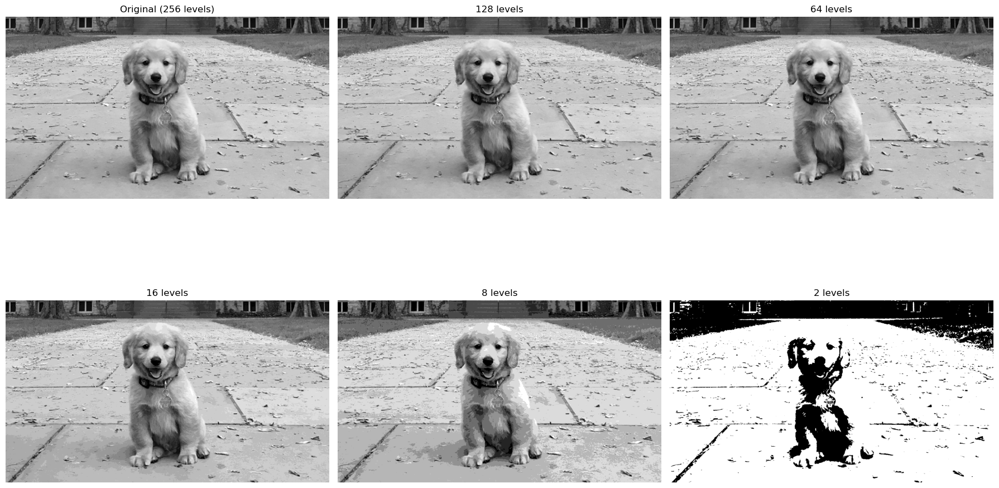

In [16]:
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

levels = [128, 64, 16, 8, 2]

plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.title("Original (256 levels)")
plt.imshow(gray_image, cmap='gray')
plt.axis('off')

for i, level in enumerate(levels):
    reduced = reduce_intensity_levels(gray_image, level)
    
    plt.subplot(2, 3, i+2)
    plt.title(f"{level} levels")
    plt.imshow(reduced, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

## 3. Spatial Averaging with Different Neighborhood Sizes

In [17]:
def spatial_average(image, kernel_size):
   
    kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)
    
    averaged = cv2.filter2D(image, -1, kernel)
    
    return averaged

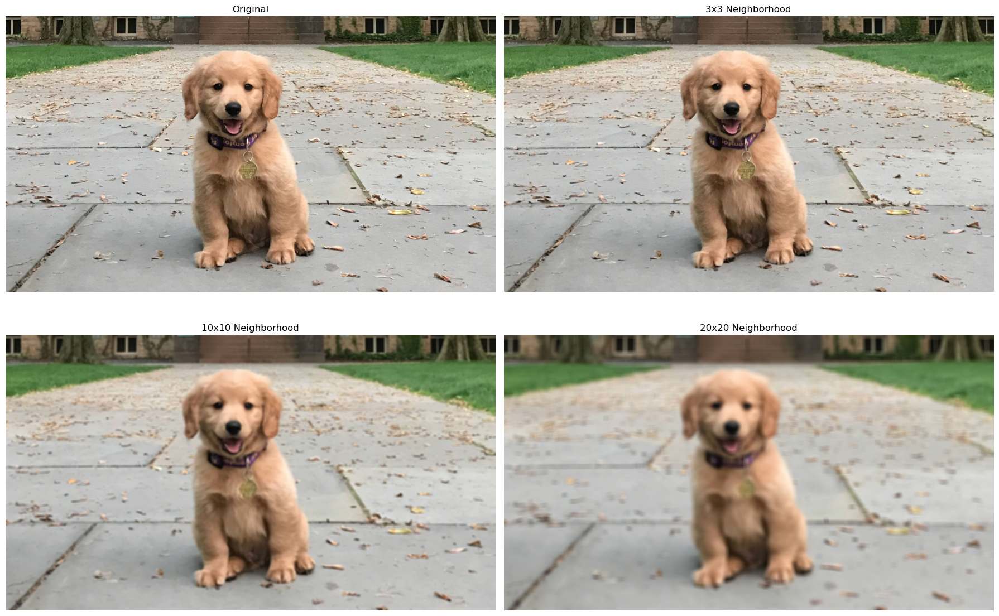

In [ ]:
kernel_sizes = [3, 10, 20]

plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(original_image_rgb)
plt.axis('off')

for i, size in enumerate(kernel_sizes):
    averaged = spatial_average(original_image, size)
    averaged_rgb = cv2.cvtColor(averaged, cv2.COLOR_BGR2RGB)
    
    plt.subplot(2, 2, i+2)
    plt.title(f"{size}x{size} Neighborhood")
    plt.imshow(averaged_rgb)
    plt.axis('off')

plt.tight_layout()
plt.show()

## 4. Rotating an Image by 45 and 90 Degrees

In this section, we'll implement a function that rotates an image by a specified angle. We'll demonstrate by rotating the image by 45 and 90 degrees.

In [9]:
def rotate_image(image, angle):
    """
    Rotate an image by a specified angle.
    
    Args:
        image: Input image
        angle: Rotation angle in degrees
    
    Returns:
        Rotated image
    """
    # Get the image dimensions
    height, width = image.shape[:2]
    
    # Calculate the center of the image
    center = (width // 2, height // 2)
    
    # Create the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Calculate new dimensions to avoid cropping
    cos = np.abs(rotation_matrix[0, 0])
    sin = np.abs(rotation_matrix[0, 1])
    
    new_width = int((height * sin) + (width * cos))
    new_height = int((height * cos) + (width * sin))
    
    # Adjust the rotation matrix to account for translation
    rotation_matrix[0, 2] += (new_width / 2) - center[0]
    rotation_matrix[1, 2] += (new_height / 2) - center[1]
    
    # Perform the rotation
    rotated = cv2.warpAffine(image, rotation_matrix, (new_width, new_height))
    
    return rotated

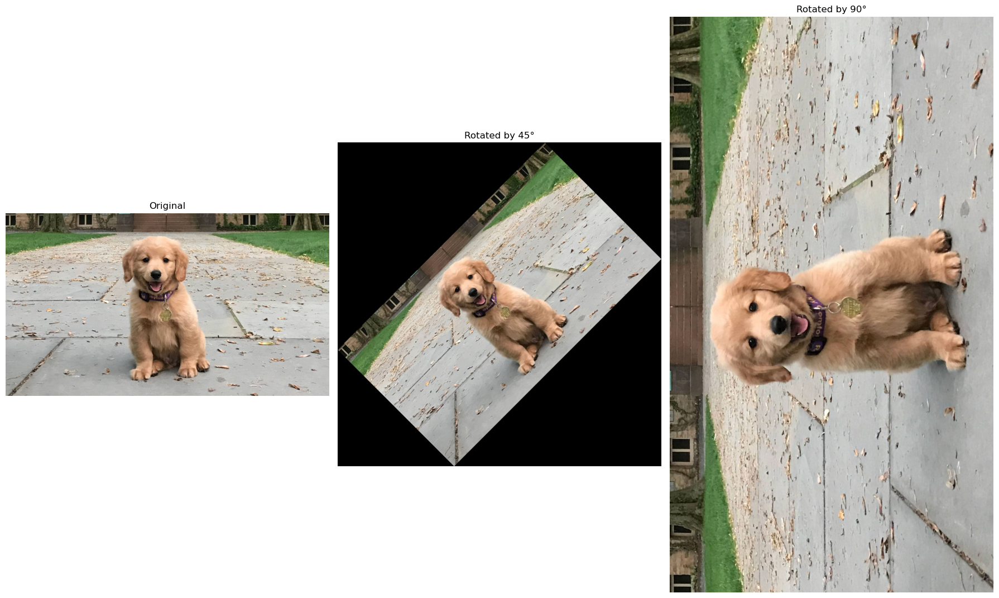

In [10]:
# Rotation angles to demonstrate
angles = [45, 90]

# Create a figure to display results
plt.figure(figsize=(18, 12))

# Original image
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(original_image_rgb)
plt.axis('off')

# Apply rotations
for i, angle in enumerate(angles):
    rotated = rotate_image(original_image, angle)
    rotated_rgb = cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB)
    
    plt.subplot(1, 3, i+2)
    plt.title(f"Rotated by {angle}°")
    plt.imshow(rotated_rgb)
    plt.axis('off')

plt.tight_layout()
plt.show()

## 5. Block Averaging for Spatial Resolution Reduction

In this section, we'll implement a function that performs block averaging on non-overlapping blocks. For each block, we'll replace all pixels with the average value. This simulates reducing the spatial resolution of the image. We'll demonstrate with 3×3, 5×5, and 7×7 blocks.

In [11]:
def block_average(image, block_size):
    """
    Replace each block of pixels with their average value.
    
    Args:
        image: Input image
        block_size: Size of the blocks (e.g., 3 for 3x3 blocks)
    
    Returns:
        Block-averaged image
    """
    # Get image dimensions
    height, width = image.shape[:2]
    channels = 1 if len(image.shape) == 2 else image.shape[2]
    
    # Calculate new dimensions
    new_height = height // block_size
    new_width = width // block_size
    
    # Create result array
    if channels == 1:
        result = np.zeros((new_height, new_width), dtype=image.dtype)
    else:
        result = np.zeros((new_height, new_width, channels), dtype=image.dtype)
    
    # Process each block
    for i in range(new_height):
        for j in range(new_width):
            # Extract the block
            y_start = i * block_size
            y_end = (i + 1) * block_size
            x_start = j * block_size
            x_end = (j + 1) * block_size
            
            # Calculate the average
            block = image[y_start:y_end, x_start:x_end]
            result[i, j] = np.mean(block, axis=(0, 1))
    
    # Resize back to original dimensions for comparison
    result_resized = cv2.resize(result, (width, height), interpolation=cv2.INTER_NEAREST)
    
    return result_resized

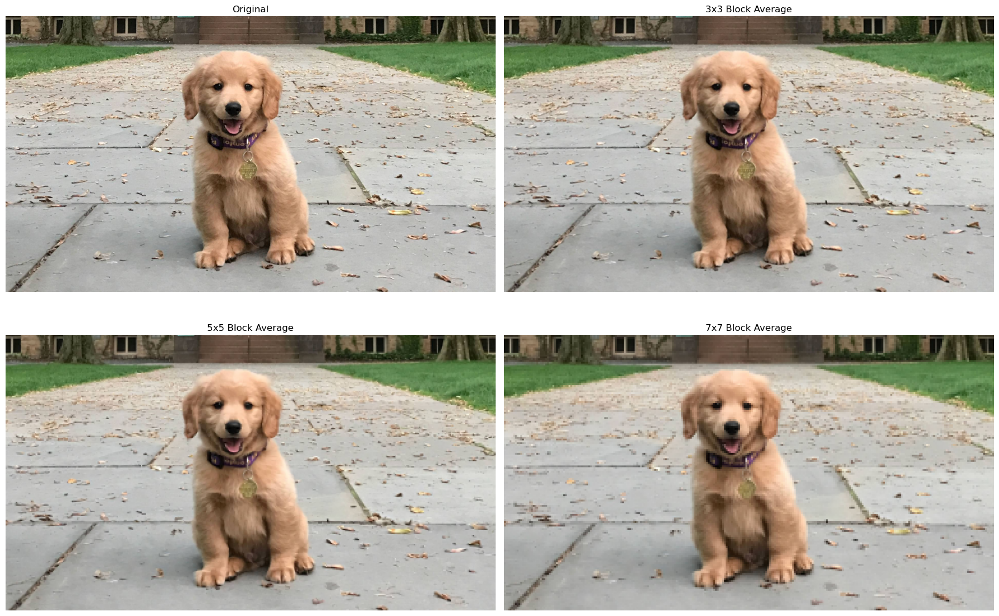

In [12]:
# Block sizes to demonstrate
block_sizes = [3, 5, 7]

# Create a figure to display results
plt.figure(figsize=(18, 12))

# Original image
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(original_image_rgb)
plt.axis('off')

# Apply block averaging
for i, size in enumerate(block_sizes):
    block_averaged = block_average(original_image, size)
    block_averaged_rgb = cv2.cvtColor(block_averaged, cv2.COLOR_BGR2RGB)
    
    plt.subplot(2, 2, i+2)
    plt.title(f"{size}x{size} Block Average")
    plt.imshow(block_averaged_rgb)
    plt.axis('off')

plt.tight_layout()
plt.show()

## Conclusion

In this assignment, we've implemented and demonstrated four fundamental image processing operations:

1. **Intensity Level Reduction**: We reduced the number of intensity levels in a grayscale image from 256 to different powers of 2 (128, 64, 16, 8, 2). This demonstrates how image quality degrades as the number of intensity levels decreases.

2. **Spatial Averaging**: We applied spatial averaging with three different neighborhood sizes: 3×3, 10×10, and 20×20. This showed how larger neighborhood sizes result in more blurred images.

3. **Image Rotation**: We rotated the image by 45 and 90 degrees, demonstrating how to preserve the entire image during rotation by adjusting the output image dimensions.

4. **Block Averaging**: We implemented block averaging with 3×3, 5×5, and 7×7 non-overlapping blocks, simulating reduced spatial resolution. This showed how image details are lost as the block size increases.

These operations are fundamental in image processing and computer vision, providing insights into how digital images can be manipulated and transformed.